In [2]:
import tensorflow as tf
import datetime
import os
import numpy as np
import pathlib
import pandas as pd
import requests
from io import BytesIO
import statistics
import random
from platform import platform
import matplotlib.pyplot as plt
import matplotlib.image as mimg
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, f1_score
from tensorflow import keras
from tensorflow.keras import layers, Model, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,BatchNormalization
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2B2
from tensorflow.keras.applications.resnet_v2 import ResNet50V2
from tensorflow.keras.layers import InputLayer, Softmax, Conv2D, MaxPooling2D, Flatten, Dense, Dropout, Rescaling, RandomFlip, RandomRotation


In [ ]:
# Detect hardware
try:
  tpu_resolver = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
  print('Running on TPU ', tpu_resolver.cluster_spec().as_dict()['worker'])
except ValueError:
  tpu_resolver = None
  print('Not running on a TPU')

Not running on a TPU


In [3]:
def print_system_info():
    print(f"nTF:     {tf.__version__}\nKeras:  {tf.keras.__version__}"
          f"\nCUDA:   {tf.sysconfig.get_build_info()['cuda_version']}\ncuDNN:  {tf.sysconfig.get_build_info()['cudnn_version']}")
    gpus = tf.config.list_physical_devices('GPU')
    print(f"\nGPUs:   {len(gpus) if gpus else 'No GPU available. Running on CPU.'}")
print_system_info()

nTF:     2.9.0
Keras:  2.9.0
CUDA:   11.2
cuDNN:  8

GPUs:   1


In [4]:
!pip uninstall tensorflow
!pip uninstall keras

Found existing installation: tensorflow 2.12.0
Uninstalling tensorflow-2.12.0:
  Would remove:
    /usr/local/bin/estimator_ckpt_converter
    /usr/local/bin/import_pb_to_tensorboard
    /usr/local/bin/saved_model_cli
    /usr/local/bin/tensorboard
    /usr/local/bin/tf_upgrade_v2
    /usr/local/bin/tflite_convert
    /usr/local/bin/toco
    /usr/local/bin/toco_from_protos
    /usr/local/lib/python3.10/dist-packages/tensorflow-2.12.0.dist-info/*
    /usr/local/lib/python3.10/dist-packages/tensorflow/*
Proceed (Y/n)? Y
Y

  Successfully uninstalled tensorflow-2.12.0
Found existing installation: keras 2.12.0
Uninstalling keras-2.12.0:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/keras-2.12.0.dist-info/*
    /usr/local/lib/python3.10/dist-packages/keras/*
Proceed (Y/n)? Y
  Successfully uninstalled keras-2.12.0


In [4]:
!pip install tensorflow==2.9
!pip install keras==2.9

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 511.7/511.7 MB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 62.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 86.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 438.7/438.7 kB 43.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 70.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 113.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.3/781.3 kB 64.5 MB/s eta 0:00:00
  Attempting uninstall: keras
    Found existing installation: keras 2.12.0
    Uninstalling keras-2.12.0:
      Successfully uninstalled keras-2.12.0
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.5.26
    Uninstalling flatbuffers-23.5.26:
      Successfully uninstalled flatbuffers-23.5.26
  Attempting uninstall: tensorf

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
main_path = 'drive/Othercomputers/MacBook/Projekt_DL/dane'

In [5]:
train = os.path.join(main_path,'train')
test = os.path.join(main_path,'test')
valid = os.path.join(main_path,'valid')

In [6]:
train_data = tf.keras.utils.image_dataset_from_directory(
    train,
    labels='inferred',
    color_mode='rgb',
    batch_size=32,
    image_size=(224, 224),
    shuffle=True,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False,
    crop_to_aspect_ratio=False
    )

test_data = tf.keras.utils.image_dataset_from_directory(
    test,
    labels='inferred',
    color_mode='rgb',
    batch_size=32,
    image_size=(224, 224),
    shuffle=True,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False,
    crop_to_aspect_ratio=False
    )

val_data = tf.keras.utils.image_dataset_from_directory(
    valid,
    labels='inferred',
    color_mode='rgb',
    batch_size=32,
    image_size=(224, 224),
    shuffle=True,
    validation_split=None,
    subset=None,
    interpolation='bilinear',
    follow_links=False,
    crop_to_aspect_ratio=False
    )

class_names = train_data.class_names
print(class_names)

Found 84635 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.
Found 2625 files belonging to 525 classes.
['ABBOTTS BABBLER', 'ABBOTTS BOOBY', 'ABYSSINIAN GROUND HORNBILL', 'AFRICAN CROWNED CRANE', 'AFRICAN EMERALD CUCKOO', 'AFRICAN FIREFINCH', 'AFRICAN OYSTER CATCHER', 'AFRICAN PIED HORNBILL', 'AFRICAN PYGMY GOOSE', 'ALBATROSS', 'ALBERTS TOWHEE', 'ALEXANDRINE PARAKEET', 'ALPINE CHOUGH', 'ALTAMIRA YELLOWTHROAT', 'AMERICAN AVOCET', 'AMERICAN BITTERN', 'AMERICAN COOT', 'AMERICAN DIPPER', 'AMERICAN FLAMINGO', 'AMERICAN GOLDFINCH', 'AMERICAN KESTREL', 'AMERICAN PIPIT', 'AMERICAN REDSTART', 'AMERICAN ROBIN', 'AMERICAN WIGEON', 'AMETHYST WOODSTAR', 'ANDEAN GOOSE', 'ANDEAN LAPWING', 'ANDEAN SISKIN', 'ANHINGA', 'ANIANIAU', 'ANNAS HUMMINGBIRD', 'ANTBIRD', 'ANTILLEAN EUPHONIA', 'APAPANE', 'APOSTLEBIRD', 'ARARIPE MANAKIN', 'ASHY STORM PETREL', 'ASHY THRUSHBIRD', 'ASIAN CRESTED IBIS', 'ASIAN DOLLARD BIRD', 'ASIAN GREEN BEE EATER', 'ASIAN OPENBILL STORK', 'AUCKLAND SHAQ', 'A

In [ ]:
clas_valid = val_data.class_names
print(clas_valid)

['ABBOTTS BABBLER', 'ABBOTTS BOOBY', 'ABYSSINIAN GROUND HORNBILL', 'AFRICAN CROWNED CRANE', 'AFRICAN EMERALD CUCKOO', 'AFRICAN FIREFINCH', 'AFRICAN OYSTER CATCHER', 'AFRICAN PIED HORNBILL', 'AFRICAN PYGMY GOOSE', 'ALBATROSS', 'ALBERTS TOWHEE', 'ALEXANDRINE PARAKEET', 'ALPINE CHOUGH', 'ALTAMIRA YELLOWTHROAT', 'AMERICAN AVOCET', 'AMERICAN BITTERN', 'AMERICAN COOT', 'AMERICAN DIPPER', 'AMERICAN FLAMINGO', 'AMERICAN GOLDFINCH', 'AMERICAN KESTREL', 'AMERICAN PIPIT', 'AMERICAN REDSTART', 'AMERICAN ROBIN', 'AMERICAN WIGEON', 'AMETHYST WOODSTAR', 'ANDEAN GOOSE', 'ANDEAN LAPWING', 'ANDEAN SISKIN', 'ANHINGA', 'ANIANIAU', 'ANNAS HUMMINGBIRD', 'ANTBIRD', 'ANTILLEAN EUPHONIA', 'APAPANE', 'APOSTLEBIRD', 'ARARIPE MANAKIN', 'ASHY STORM PETREL', 'ASHY THRUSHBIRD', 'ASIAN CRESTED IBIS', 'ASIAN DOLLARD BIRD', 'ASIAN GREEN BEE EATER', 'ASIAN OPENBILL STORK', 'AUCKLAND SHAQ', 'AUSTRAL CANASTERO', 'AUSTRALASIAN FIGBIRD', 'AVADAVAT', 'AZARAS SPINETAIL', 'AZURE BREASTED PITTA', 'AZURE JAY', 'AZURE TANAGER', '

In [ ]:
# # normalize the dataset to get (input) values between 0-1
# def normalize_data(dataset):
#     # To rescale an input in the [0, 255] range to be in the [0, 1] range, you would pass scale=1./255.
#     normalization_layer = Rescaling(1./255)
#     normalized_dataset = dataset.map(lambda x, y: (normalization_layer(x), y))

#     return normalized_dataset

# # normalize every dataset
# normalized_train_data = normalize_data(train_data)
# normalized_val_data = normalize_data(val_data)
# normalized_test_data = normalize_data(test_data)

In [ ]:
# # testing out the noramlization results
# image_batch, labels_batch = next(iter(normalized_train_data))
# first_image = image_batch[0]
# print(np.min(first_image), np.max(first_image)) # print scaled(!) minimum value (0-1)

0.0 1.0


In [ ]:
next(iter(test_data))

In [ ]:
for image, labels in train_data:
  print(image.shape)
  break

(32, 224, 224, 3)


In [ ]:
for image, labels in train_data:
  print(image)
  break

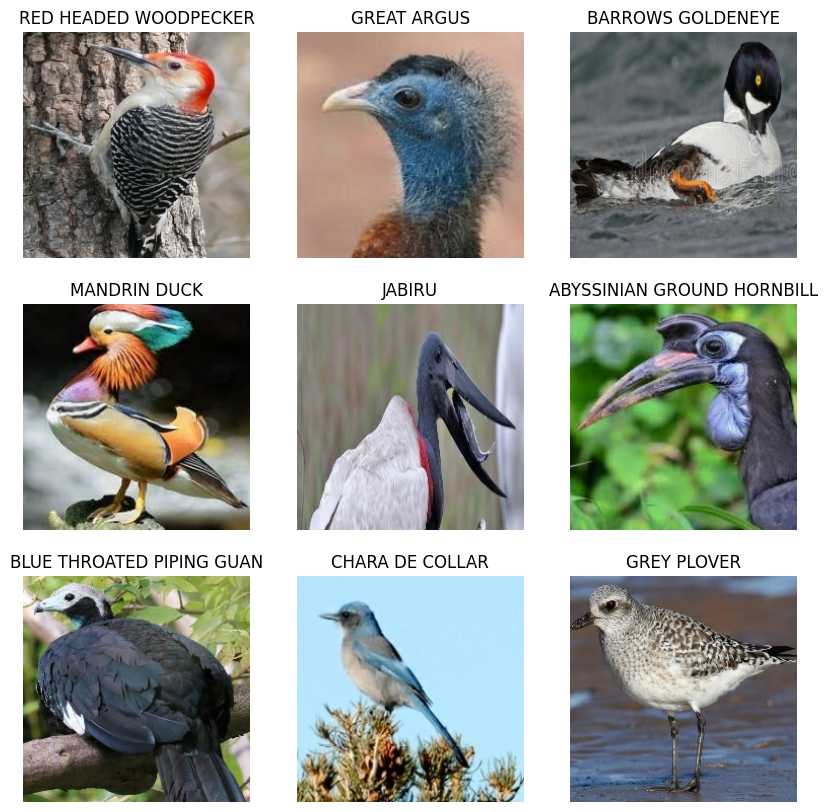

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_data.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

# Wlasny prosty model CNN - bez augumentacji

In [ ]:
# data augumentaition - applied in the model as layers

num_classes = 525

model_cnn = Sequential()
model_cnn.add(InputLayer(input_shape=(224, 224, 3)))
model_cnn.add(Rescaling(1./255))
model_cnn.add(Conv2D(64, 3, activation='relu'))
model_cnn.add(MaxPooling2D((2,2)))
model_cnn.add(Conv2D(128, 3, activation='relu'))
model_cnn.add(MaxPooling2D((2,2)))
model_cnn.add(Conv2D(256, 3, activation='relu'))
model_cnn.add(MaxPooling2D((2,2)))
model_cnn.add(BatchNormalization())
model_cnn.add(Dense(128, activation='relu'))
model_cnn.add(Dropout(0.2))
model_cnn.add(Flatten())
model_cnn.add(Dense(64, activation='relu'))
model_cnn.add(Dropout(0.2))
model_cnn.add(Dense(num_classes))
model_cnn.add(Softmax())
print(model_cnn.summary())


Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_9 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 conv2d_34 (Conv2D)          (None, 222, 222, 64)      1792      
                                                                 
 max_pooling2d_34 (MaxPoolin  (None, 111, 111, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_35 (Conv2D)          (None, 109, 109, 128)     73856     
                                                                 
 max_pooling2d_35 (MaxPoolin  (None, 54, 54, 128)      0         
 g2D)                                                            
                                                                 
 conv2d_36 (Conv2D)          (None, 52, 52, 256)      

In [ ]:
model_cnn.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001), loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
# callback early stopping
# zatrzymanie treningu w momencie, kiedy val_loss nie spada przez n epok
es_cnn = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=5
    )

# dodajemy zapisywanie logów do tensorboard'a
log_dir = "drive/Othercomputers/MacBook/Projekt_DL/dane/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
model_hist = model_cnn.fit(train_data, validation_data = val_data, epochs = 45, callbacks = [tensorboard_callback, es_cnn])

Epoch 1/45
2645/2645 [==============================] - 8362s 3s/step - loss: 6.2067 - accuracy: 0.0055 - val_loss: 6.0770 - val_accuracy: 0.0122
Epoch 2/45
2645/2645 [==============================] - 307s 116ms/step - loss: 5.9936 - accuracy: 0.0179 - val_loss: 5.7650 - val_accuracy: 0.0354
Epoch 3/45
2645/2645 [==============================] - 311s 117ms/step - loss: 5.7183 - accuracy: 0.0368 - val_loss: 5.4481 - val_accuracy: 0.0590
Epoch 4/45
2645/2645 [==============================] - 307s 116ms/step - loss: 5.4380 - accuracy: 0.0574 - val_loss: 5.1305 - val_accuracy: 0.0971
Epoch 5/45
2645/2645 [==============================] - 311s 118ms/step - loss: 5.1741 - accuracy: 0.0789 - val_loss: 4.8753 - val_accuracy: 0.1189
Epoch 6/45
2645/2645 [==============================] - 312s 118ms/step - loss: 4.9473 - accuracy: 0.1000 - val_loss: 4.6480 - val_accuracy: 0.1440
Epoch 7/45
2645/2645 [==============================] - 309s 117ms/step - loss: 4.7353 - accuracy: 0.1221 - val_lo

In [ ]:
model_cnn.save('drive/Othercomputers/MacBook/Projekt_DL/dane/model_cnn_newest.h5')

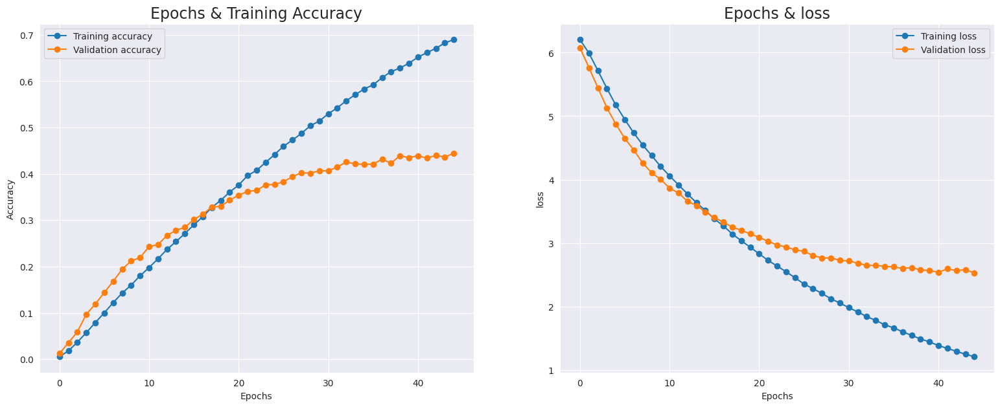

In [ ]:
#Visualizing the result
acc = model_hist.history['accuracy']
val_acc = model_hist.history['val_accuracy']
loss = model_hist.history['loss']
val_loss = model_hist.history['val_loss']

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (19,7))
sns.set_style("darkgrid")

ax[0].plot(acc, 'o-',label = 'Training accuracy')
ax[0].plot(val_acc, 'o-',label = 'Validation accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].set_title('Epochs & Training Accuracy', fontsize = 17)
ax[0].legend(loc='best')


ax[1].plot(loss, 'o-',label = 'Training loss')
ax[1].plot(val_loss, 'o-',label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('loss')
ax[1].set_title('Epochs & loss', fontsize = 17)
ax[1].legend(loc='best')
sns.set_style("darkgrid")

In [ ]:
test_labels = test_data.class_names

plt.figure(figsize=(30, 30))

for image, label in test_data.take(1):
    model_prediction = model_cnn.predict(image)
    for i in range(30):
        plt.subplot(6, 5, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        p = test_labels[tf.argmax(tf.round(model_prediction[i]))]
        t = test_labels[(label[i])]
        if p == t:
          m = "Perfect"
        else:
          m = "Error"
        plt.title(f"Prediction: {p}\n Original Labels : {t}\n Match : {m}")
        plt.grid(False)
        plt.axis("off")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

# Wlasny prosty model CNN - very simple - drobne korekty w modelu + augumentacja

In [7]:
# data augumentaition - applied in the model as layers

num_classes = 525

model_cna = Sequential()
model_cna.add(InputLayer(input_shape=(224, 224, 3)))
model_cna.add(Rescaling(1./255))
model_cna.add(RandomFlip("horizontal_and_vertical"))
model_cna.add(RandomRotation(0.2))
model_cna.add(Conv2D(32, 5, activation='relu'))
model_cna.add(MaxPooling2D((2,2)))
model_cna.add(Conv2D(64, 5, activation='relu'))
model_cna.add(MaxPooling2D((2,2)))
model_cna.add(Conv2D(32, 3, activation='relu'))
model_cna.add(MaxPooling2D((2,2)))
model_cna.add(Conv2D(16, 3, activation='relu'))
model_cna.add(MaxPooling2D((2,2)))
model_cna.add(Conv2D(32, 1, activation='relu'))
model_cna.add(MaxPooling2D((1,1)))
model_cna.add(BatchNormalization())
model_cna.add(Dense(16, activation='relu'))
model_cna.add(Dropout(0.2))
model_cna.add(Flatten())
model_cna.add(Dropout(0.2))
model_cna.add(Dense(num_classes))
model_cna.add(Softmax())
print(model_cna.summary())


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 random_flip (RandomFlip)    (None, 224, 224, 3)       0         
                                                                 
 random_rotation (RandomRota  (None, 224, 224, 3)      0         
 tion)                                                           
                                                                 
 conv2d (Conv2D)             (None, 220, 220, 32)      2432      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 110, 110, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 106, 106, 64)      5

In [8]:
model_cna.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001), loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [10]:
# callback early stopping
# zatrzymanie treningu w momencie, kiedy val_loss nie spada przez n epok
es_cna = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=5
    )

# dodajemy zapisywanie logów do tensorboard'a
log_dir = "drive/Othercomputers/MacBook/Projekt_DL/dane/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

modelcheck_lr_a = tf.keras.callbacks.ModelCheckpoint(filepath= 'drive/Othercomputers/MacBook/Projekt_DL/dane/model_cna_final4.h5'
 ,monitor='val_loss', save_best_only = True, save_format='tf')

In [ ]:
model_hist_cna = model_cna.fit(train_data, validation_data = val_data, epochs = 80, callbacks = [tensorboard_callback, es_cna, modelcheck_lr_a])

In [ ]:
#Visualizing the result
acc = model_hist_cna.history['accuracy']
val_acc = model_hist_cna.history['val_accuracy']
loss = model_hist_cna.history['loss']
val_loss = model_hist_cna.history['val_loss']

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (19,7))
sns.set_style("darkgrid")

ax[0].plot(acc, 'o-',label = 'Training accuracy')
ax[0].plot(val_acc, 'o-',label = 'Validation accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].set_title('Epochs & Training Accuracy', fontsize = 17)
ax[0].legend(loc='best')


ax[1].plot(loss, 'o-',label = 'Training loss')
ax[1].plot(val_loss, 'o-',label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('loss')
ax[1].set_title('Epochs & loss', fontsize = 17)
ax[1].legend(loc='best')
sns.set_style("darkgrid")

# Efficient_Net_B0 i dodatkowe własne layery (bez skalowania)

In [ ]:
# Downloading the pre-trained model from API
eff_net_model = tf.keras.applications.efficientnet.EfficientNetB0(
                    include_top=False,
                    weights='imagenet',
                    input_shape=(224,224,3),
                    pooling='max',
                    classes=525,
                    classifier_activation='softmax'
                )

# setting all the layers of this model to false
for layer in eff_net_model.layers:
    layer.trainable = False

16705208/16705208 [==============================] - 2s 0us/step


In [ ]:
model = Sequential()
model.add(eff_net_model)
model.add(Dense(2560,activation='relu'))
model.add(BatchNormalization())
model.add(Dense(1280,activation='relu'))
model.add(Dense(525,activation='softmax'))

model.summary()

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb0 (Functional)  (None, 1280)             4049571   
                                                                 
 dense_18 (Dense)            (None, 2560)              3279360   
                                                                 
 batch_normalization_3 (Batc  (None, 2560)             10240     
 hNormalization)                                                 
                                                                 
 dense_19 (Dense)            (None, 1280)              3278080   
                                                                 
 dense_20 (Dense)            (None, 525)               672525    
                                                                 
Total params: 11,289,776
Trainable params: 7,235,085
Non-trainable params: 4,054,691
__________________________________

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001), loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
# callback early stopping
# zatrzymanie treningu w momencie, kiedy val_loss nie spada przez n epok
es = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=5
)

# dodajemy zapisywanie logów do tensorboard'a
log_dir = "drive/Othercomputers/MacBook/Projekt_DL/dane/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
model_hist = model.fit(train_data, validation_data = val_data, epochs = 45, callbacks = [tensorboard_callback, es])

Epoch 1/45
2645/2645 [==============================] - 183s 67ms/step - loss: 3.6036 - accuracy: 0.4237 - val_loss: 1.2277 - val_accuracy: 0.8267
Epoch 2/45
2645/2645 [==============================] - 178s 67ms/step - loss: 1.1081 - accuracy: 0.8157 - val_loss: 0.4891 - val_accuracy: 0.9128
Epoch 3/45
2645/2645 [==============================] - 179s 68ms/step - loss: 0.6236 - accuracy: 0.8800 - val_loss: 0.3152 - val_accuracy: 0.9345
Epoch 4/45
2645/2645 [==============================] - 179s 68ms/step - loss: 0.4335 - accuracy: 0.9123 - val_loss: 0.2426 - val_accuracy: 0.9417
Epoch 5/45
2645/2645 [==============================] - 178s 67ms/step - loss: 0.3268 - accuracy: 0.9339 - val_loss: 0.2027 - val_accuracy: 0.9512
Epoch 6/45
2645/2645 [==============================] - 177s 67ms/step - loss: 0.2556 - accuracy: 0.9488 - val_loss: 0.1778 - val_accuracy: 0.9539
Epoch 7/45
2645/2645 [==============================] - 179s 68ms/step - loss: 0.2051 - accuracy: 0.9604 - val_loss: 0

In [ ]:
 #Visualizing the result
acc = model_hist.history['accuracy']
val_acc = model_hist.history['val_accuracy']
loss = model_hist.history['loss']
val_loss = model_hist.history['val_loss']

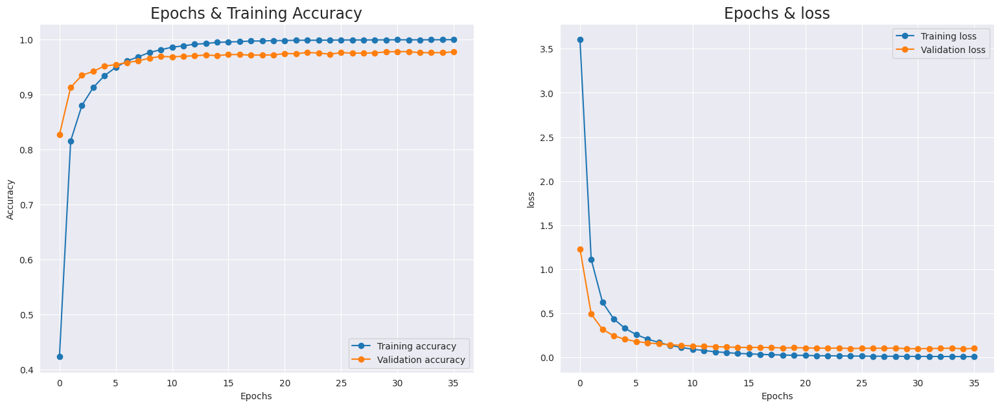

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (19,7))
sns.set_style("darkgrid")

ax[0].plot(acc, 'o-',label = 'Training accuracy')
ax[0].plot(val_acc, 'o-',label = 'Validation accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].set_title('Epochs & Training Accuracy', fontsize = 17)
ax[0].legend(loc='best')


ax[1].plot(loss, 'o-',label = 'Training loss')
ax[1].plot(val_loss, 'o-',label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('loss')
ax[1].set_title('Epochs & loss', fontsize = 17)
ax[1].legend(loc='best')
sns.set_style("darkgrid")

In [ ]:
# testowanie
y_pred = model.predict(test_data)
type(y_pred)

In [ ]:
#model.save_weights('drive/Othercomputers/MacBook/Projekt_DL/dane/weights_15')

In [ ]:
model.save('drive/Othercomputers/MacBook/Projekt_DL/dane/model_EfB0_newest.h5')

In [ ]:
type(test_data)
print(len(test_data))
print(test_data.class_names)

2625
['ABBOTTS BABBLER', 'ABBOTTS BOOBY', 'ABYSSINIAN GROUND HORNBILL', 'AFRICAN CROWNED CRANE', 'AFRICAN EMERALD CUCKOO', 'AFRICAN FIREFINCH', 'AFRICAN OYSTER CATCHER', 'AFRICAN PIED HORNBILL', 'AFRICAN PYGMY GOOSE', 'ALBATROSS', 'ALBERTS TOWHEE', 'ALEXANDRINE PARAKEET', 'ALPINE CHOUGH', 'ALTAMIRA YELLOWTHROAT', 'AMERICAN AVOCET', 'AMERICAN BITTERN', 'AMERICAN COOT', 'AMERICAN DIPPER', 'AMERICAN FLAMINGO', 'AMERICAN GOLDFINCH', 'AMERICAN KESTREL', 'AMERICAN PIPIT', 'AMERICAN REDSTART', 'AMERICAN ROBIN', 'AMERICAN WIGEON', 'AMETHYST WOODSTAR', 'ANDEAN GOOSE', 'ANDEAN LAPWING', 'ANDEAN SISKIN', 'ANHINGA', 'ANIANIAU', 'ANNAS HUMMINGBIRD', 'ANTBIRD', 'ANTILLEAN EUPHONIA', 'APAPANE', 'APOSTLEBIRD', 'ARARIPE MANAKIN', 'ASHY STORM PETREL', 'ASHY THRUSHBIRD', 'ASIAN CRESTED IBIS', 'ASIAN DOLLARD BIRD', 'ASIAN GREEN BEE EATER', 'ASIAN OPENBILL STORK', 'AUCKLAND SHAQ', 'AUSTRAL CANASTERO', 'AUSTRALASIAN FIGBIRD', 'AVADAVAT', 'AZARAS SPINETAIL', 'AZURE BREASTED PITTA', 'AZURE JAY', 'AZURE TANAGE

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('drive/Othercomputers/MacBook/Projekt_DL/dane/model_15.h5')

In [ ]:
loss, accuracy = model.evaluate(test_data)
print('Test accuracy :', accuracy)

83/83 [==============================] - 34s 357ms/step - loss: 0.0861 - accuracy: 0.9790
Test accuracy : 0.9790475964546204


In [ ]:
image, label = next(iter(test_data))
print(model.predict(image).sum())
print(label)

1.0000001
tf.Tensor([162], shape=(1,), dtype=int32)


In [ ]:
test_labels = test_data.class_names

plt.figure(figsize=(30, 30))

for image, label in test_data.take(1):
    model_prediction = model.predict(image)
    for i in range(30):
        plt.subplot(6, 5, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        p = test_labels[tf.argmax(tf.round(model_prediction[i]))]
        t = test_labels[(label[i])]
        if p == t:
          m = "Perfect"
        else:
          m = "Error"
        plt.title(f"Prediction: {p}\n Original Labels : {t}\n Match : {m}")
        plt.grid(False)
        plt.axis("off")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# # Plot prediction results

# image_batch, label_batch = test_data.as_numpy_iterator().next()
# predicted_batch = model.predict(image_batch)
# predicted_id = np.argmax(predicted_batch, axis=-1)

# for i in range(32):
#     x = predicted_id[i]
#     print('Class_predicted_nr:', predicted_id[i])
#     print('Name_predicted:', class_names[predicted_id[i]])
#     print('True_name:     ', train_data.class_names[x])



In [ ]:
# %load_ext tensorboard
# %tensorboard --logdir "logs\20230604-144929"

# EfficientNet-B0 - very simple - augumentacja plus korekty w sposobie liczenia

In [9]:
# Downloading the pre-trained model from API
eff_net_model_base = tf.keras.applications.efficientnet.EfficientNetB0(
                    include_top=False,
                    weights='imagenet',
                    input_shape=(224,224,3),
                    pooling='max',
                    classes=525,
                    classifier_activation='softmax'
                )

# setting all the layers of this model to false
eff_net_model_base.trainable = False

16705208/16705208 [==============================] - 1s 0us/step


In [10]:
model_efs = Sequential()
model_efs.add(InputLayer(input_shape=(224, 224, 3)))
model_efs.add(RandomFlip("horizontal_and_vertical"))
model_efs.add(RandomRotation(0.2))
model_efs.add(eff_net_model_base)

model_efs.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 random_flip (RandomFlip)    (None, 224, 224, 3)       0         
                                                                 
 random_rotation (RandomRota  (None, 224, 224, 3)      0         
 tion)                                                           
                                                                 
 efficientnetb0 (Functional)  (None, 1280)             4049571   
                                                                 
Total params: 4,049,571
Trainable params: 0
Non-trainable params: 4,049,571
_________________________________________________________________


In [11]:
model_efs.compile(optimizer = tf.keras.optimizers.Adam(), loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [12]:
# callback early stopping
# zatrzymanie treningu w momencie, kiedy val_loss nie spada przez n epok
es_efs = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=5
)

# dodajemy zapisywanie logów do tensorboard'a
log_dir = "drive/Othercomputers/MacBook/Projekt_DL/dane/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

modelcheck_lr_s = tf.keras.callbacks.ModelCheckpoint(filepath= 'drive/Othercomputers/MacBook/Projekt_DL/dane/model_efn0_changed.h5'
 ,monitor='val_loss', save_best_only = True, save_format='tf')

In [ ]:
model_hist_efs = model_efs.fit(train_data, validation_data = val_data, epochs = 10, callbacks = [tensorboard_callback, es_efs, modelcheck_lr_s])

Epoch 1/10
1804/2645 [===================>..........] - ETA: 1:08 - loss: 8.8251 - accuracy: 9.0078e-04

In [ ]:
# setting all the layers of this model to True - start training
eff_net_model_base.trainable = True

In [ ]:
model_efs.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001), loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
model_hist_efs = model_efs.fit(train_data, validation_data = val_data, epochs = 80, callbacks = [tensorboard_callback, es_efs, modelcheck_lr_s])

# EfficientNet_B0 i augumentacja (skalowanie)

In [ ]:
model_ef = Sequential()
model_ef.add(InputLayer(input_shape=(224, 224, 3)))
model_ef.add(Rescaling(1./255))
model_ef.add(RandomFlip("horizontal_and_vertical"))
model_ef.add(RandomRotation(0.2))
model_ef.add(eff_net_model)
model_ef.add(Dense(2560,activation='relu'))
model_ef.add(BatchNormalization())
model_ef.add(Dense(1280,activation='relu'))
model_ef.add(Dense(525,activation='softmax'))

model_ef.summary()

Model: "sequential_40"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_29 (Rescaling)    (None, 224, 224, 3)       0         
                                                                 
 random_flip_19 (RandomFlip)  (None, 224, 224, 3)      0         
                                                                 
 random_rotation_19 (RandomR  (None, 224, 224, 3)      0         
 otation)                                                        
                                                                 
 efficientnetb0 (Functional)  (None, 1280)             4049571   
                                                                 
 dense_73 (Dense)            (None, 2560)              3279360   
                                                                 
 batch_normalization_3 (Batc  (None, 2560)             10240     
 hNormalization)                                     

In [ ]:
model_ef.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001), loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
# callback early stopping
# zatrzymanie treningu w momencie, kiedy val_loss nie spada przez n epok
es_ef = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=5
)

# dodajemy zapisywanie logów do tensorboard'a
log_dir = "drive/Othercomputers/MacBook/Projekt_DL/dane/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
model_hist_ef = model_ef.fit(train_data, validation_data = val_data, epochs = 15, callbacks = [tensorboard_callback, es_ef])

Epoch 1/15
2645/2645 [==============================] - 1259s 472ms/step - loss: 6.3318 - accuracy: 0.0019 - val_loss: 6.2941 - val_accuracy: 0.0019
Epoch 2/15
2645/2645 [==============================] - 1186s 448ms/step - loss: 6.2917 - accuracy: 0.0025 - val_loss: 6.2888 - val_accuracy: 0.0019
Epoch 3/15
2645/2645 [==============================] - 1183s 447ms/step - loss: 6.2840 - accuracy: 0.0025 - val_loss: 6.2768 - val_accuracy: 0.0030
Epoch 4/15
2645/2645 [==============================] - 1196s 452ms/step - loss: 6.2794 - accuracy: 0.0023 - val_loss: 6.2741 - val_accuracy: 0.0027
Epoch 5/15
2645/2645 [==============================] - 1194s 451ms/step - loss: 6.2776 - accuracy: 0.0025 - val_loss: 6.2759 - val_accuracy: 0.0015
Epoch 6/15
2645/2645 [==============================] - 1201s 454ms/step - loss: 6.2743 - accuracy: 0.0026 - val_loss: 6.2673 - val_accuracy: 0.0019
Epoch 7/15
2645/2645 [==============================] - 1187s 449ms/step - loss: 6.2714 - accuracy: 0.0027

In [ ]:
model_ef.save('drive/Othercomputers/MacBook/Projekt_DL/dane/model_ef_augem.h5')

NameError: ignored

In [ ]:
model_ef.save_weights('drive/Othercomputers/MacBook/Projekt_DL/dane/weights_ef_aug_15')

In [ ]:
 #Visualizing the result
acc = model_hist_ef.history['accuracy']
val_acc = model_hist_ef.history['val_accuracy']
loss = model_hist_ef.history['loss']
val_loss = model_hist_ef.history['val_loss']

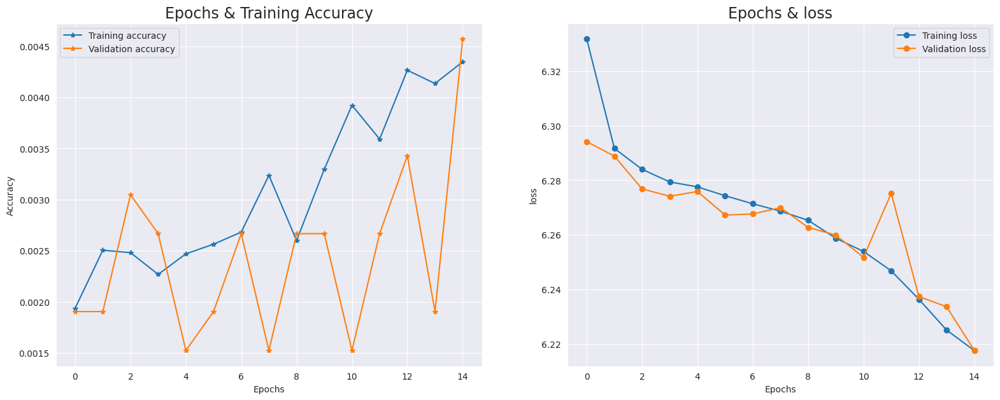

In [ ]:
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (19,7))
sns.set_style("darkgrid")

ax[0].plot(acc, '*-',label = 'Training accuracy')
ax[0].plot(val_acc, '*-',label = 'Validation accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].set_title('Epochs & Training Accuracy', fontsize = 17)
ax[0].legend(loc='best')


ax[1].plot(loss, 'o-',label = 'Training loss')
ax[1].plot(val_loss, 'o-',label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('loss')
ax[1].set_title('Epochs & loss', fontsize = 17)
ax[1].legend(loc='best')
sns.set_style("darkgrid")

In [ ]:
test_labels = test_data.class_names

plt.figure(figsize=(30, 30))

for image, label in test_data.take(1):
    model_prediction = model_ef.predict(image)
    for i in range(30):
        plt.subplot(6, 5, i+1)
        plt.imshow(image[i].numpy().astype("uint8"))
        p = test_labels[tf.argmax(tf.round(model_prediction[i]))]
        t = test_labels[(label[i])]
        if p == t:
          m = "Perfect"
        else:
          m = "Error"
        plt.title(f"Prediction: {p}\n Original Labels : {t}\n Match : {m}")
        plt.grid(False)
        plt.axis("off")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

# Resnet50_V2 - skalowanie - pierwsza wersja - slabe wyniki

In [ ]:
res_net_model = tf.keras.applications.resnet_v2.ResNet50V2(
                    include_top=False,
                    weights='imagenet',
                    input_shape=(224,224,3),
                    pooling='max',
                    classes=525,
                    classifier_activation='softmax'
                )

# setting all the layers of this model to false
### wyrzucic - nauczyć ostania wartwe - zamrozenie do przedostaniej warstwy
# for layer in res_net_model.layers:
#     layer.trainable = False

In [ ]:

model_res = Sequential()
model_res.add(InputLayer(input_shape=(224, 224, 3)))
model_res.add(Rescaling(1./255))
model_res.add(RandomFlip("horizontal_and_vertical"))
model_res.add(RandomRotation(0.2))
model_res.add(res_net_model)

model_res.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 random_flip (RandomFlip)    (None, 224, 224, 3)       0         
                                                                 
 random_rotation (RandomRota  (None, 224, 224, 3)      0         
 tion)                                                           
                                                                 
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
Total params: 23,564,800
Trainable params: 0
Non-trainable params: 23,564,800
_________________________________________________________________


In [ ]:
model_res.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001), loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
# callback early stopping
# zatrzymanie treningu w momencie, kiedy val_loss nie spada przez n epok
es_rs = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=5
)

# dodajemy zapisywanie logów do tensorboard'a
log_dir = "drive/Othercomputers/MacBook/Projekt_DL/dane/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
model_hist_rs = model_res.fit(train_data, validation_data = val_data, epochs = 15, callbacks = [tensorboard_callback, es_rs])

Epoch 1/15
2645/2645 [==============================] - 1112s 418ms/step - loss: 12.1475 - accuracy: 2.7176e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04
Epoch 2/15
2645/2645 [==============================] - 1074s 406ms/step - loss: 12.1484 - accuracy: 2.2449e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04
Epoch 3/15
2645/2645 [==============================] - 1083s 409ms/step - loss: 12.1393 - accuracy: 2.8357e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04
Epoch 4/15
2645/2645 [==============================] - 1098s 415ms/step - loss: 12.1789 - accuracy: 2.5994e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04
Epoch 5/15
2645/2645 [==============================] - 1095s 414ms/step - loss: 12.1910 - accuracy: 2.5994e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04
Epoch 6/15
2645/2645 [==============================] - 1103s 417ms/step - loss: 12.1491 - accuracy: 3.4265e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04


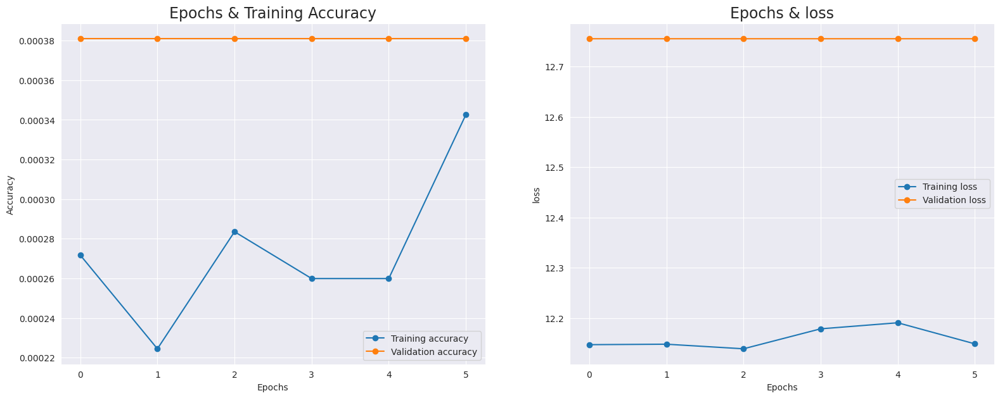

In [ ]:
 #Visualizing the result
acc = model_hist_rs.history['accuracy']
val_acc = model_hist_rs.history['val_accuracy']
loss = model_hist_rs.history['loss']
val_loss = model_hist_rs.history['val_loss']

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (19,7))
sns.set_style("darkgrid")

ax[0].plot(acc, 'o-',label = 'Training accuracy')
ax[0].plot(val_acc, 'o-',label = 'Validation accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].set_title('Epochs & Training Accuracy', fontsize = 17)
ax[0].legend(loc='best')


ax[1].plot(loss, 'o-',label = 'Training loss')
ax[1].plot(val_loss, 'o-',label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('loss')
ax[1].set_title('Epochs & loss', fontsize = 17)
ax[1].legend(loc='best')
sns.set_style("darkgrid")

# Resnet50 bez augementacji - kiepskie wyniki

In [ ]:

model_res2 = Sequential()
model_res2.add(InputLayer(input_shape=(224, 224, 3)))
model_res2.add(res_net_model)

model_res2.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
Total params: 23,564,800
Trainable params: 0
Non-trainable params: 23,564,800
_________________________________________________________________


In [ ]:
model_res2.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001), loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
# callback early stopping
# zatrzymanie treningu w momencie, kiedy val_loss nie spada przez n epok
es_rs2 = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=5
)

# dodajemy zapisywanie logów do tensorboard'a
log_dir = "drive/Othercomputers/MacBook/Projekt_DL/dane/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:

model_hist_rs2 = model_res.fit(train_data, validation_data = val_data, epochs = 15, callbacks = [tensorboard_callback, es_rs2])

Epoch 1/15
2645/2645 [==============================] - 1146s 433ms/step - loss: 12.1789 - accuracy: 2.7176e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04
Epoch 2/15
2645/2645 [==============================] - 1130s 427ms/step - loss: 12.1582 - accuracy: 3.1902e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04
Epoch 3/15
2645/2645 [==============================] - 1111s 420ms/step - loss: 12.1407 - accuracy: 2.4812e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04
Epoch 4/15
2645/2645 [==============================] - 1157s 438ms/step - loss: 12.1535 - accuracy: 2.7176e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04
Epoch 5/15
2645/2645 [==============================] - 1155s 437ms/step - loss: 12.1571 - accuracy: 2.3631e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04
Epoch 6/15
2645/2645 [==============================] - 1145s 433ms/step - loss: 12.1310 - accuracy: 2.3631e-04 - val_loss: 12.7551 - val_accuracy: 3.8095e-04


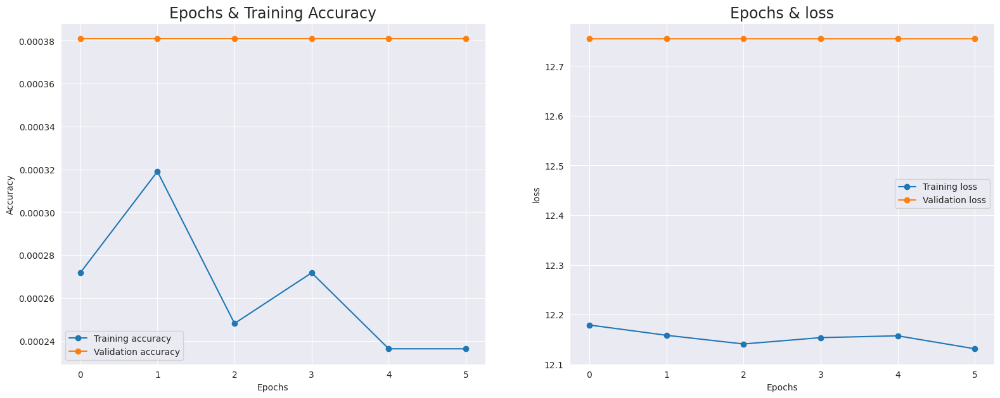

In [ ]:
#Visualizing the result
acc = model_hist_rs2.history['accuracy']
val_acc = model_hist_rs2.history['val_accuracy']
loss = model_hist_rs2.history['loss']
val_loss = model_hist_rs2.history['val_loss']

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (19,7))
sns.set_style("darkgrid")

ax[0].plot(acc, 'o-',label = 'Training accuracy')
ax[0].plot(val_acc, 'o-',label = 'Validation accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].set_title('Epochs & Training Accuracy', fontsize = 17)
ax[0].legend(loc='best')


ax[1].plot(loss, 'o-',label = 'Training loss')
ax[1].plot(val_loss, 'o-',label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('loss')
ax[1].set_title('Epochs & loss', fontsize = 17)
ax[1].legend(loc='best')
sns.set_style("darkgrid")

# Resnet50_V2 - 2 podejscie (skalowanie) -  rewelacyjne wyniki

In [ ]:
# normalize the dataset to get (input) values between 0-1
def normalize_data(dataset):
    # To rescale an input in the [0, 255] range to be in the [0, 1] range, you would pass scale=1./255.
    normalization_layer = Rescaling(1./255)
    normalized_dataset = dataset.map(lambda x, y: (normalization_layer(x), y))

    return normalized_dataset

# normalize every dataset
normalized_train_data = normalize_data(train_data)
normalized_val_data = normalize_data(val_data)
normalized_test_data = normalize_data(test_data)

In [ ]:
res_net50_model = tf.keras.applications.resnet_v2.ResNet50V2(
                    include_top=False,
                    weights='imagenet',
                    input_shape=(224,224,3),
                    pooling='max'
                )

# setting all the layers of this model to false
res_net50_model.trainable = False

94668760/94668760 [==============================] - 3s 0us/step


In [ ]:
# inputs = res_net50_model.input

# x = Dense(120, activation='relu')(res_net50_model.output)
# x = Dense(120, activation='relu')(x)#adding some custom layers of our coice

# outputs = Dense(310, activation='softmax')(x)
# #output choice
# model_res3 = Model(inputs=inputs, outputs=outputs)

# #model_res3.summary()

In [ ]:
model_res3= Sequential()
model_res3.add(InputLayer(input_shape=(224, 224, 3)))
model_res3.add(Rescaling(1./255))
model_res3.add(res_net50_model)
model_res3.add(Dense(1024,activation='relu'))
model_res3.add(BatchNormalization())
model_res3.add(Dense(512,activation='relu'))
model_res3.add(Dense(525,activation='softmax'))

model_res3.summary()

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_7 (Rescaling)     (None, 224, 224, 3)       0         
                                                                 
 resnet50v2 (Functional)     (None, 2048)              23564800  
                                                                 
 dense_52 (Dense)            (None, 1024)              2098176   
                                                                 
 batch_normalization_16 (Bat  (None, 1024)             4096      
 chNormalization)                                                
                                                                 
 dense_53 (Dense)            (None, 512)               524800    
                                                                 
 dense_54 (Dense)            (None, 525)               269325    
                                                     

In [ ]:
model_res3.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001), loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
# callback early stopping
# zatrzymanie treningu w momencie, kiedy val_loss nie spada przez n epok
es_rs3 = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=5
)

# dodajemy zapisywanie logów do tensorboard'a
log_dir = "drive/Othercomputers/MacBook/Projekt_DL/dane/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
model_hist_rs3 = model_res3.fit(train_data, validation_data = val_data, epochs = 45, callbacks = [tensorboard_callback, es_rs3])

Epoch 1/45
2645/2645 [==============================] - 252s 94ms/step - loss: 5.2516 - accuracy: 0.1302 - val_loss: 3.9314 - val_accuracy: 0.3307
Epoch 2/45
2645/2645 [==============================] - 250s 95ms/step - loss: 3.2682 - accuracy: 0.4315 - val_loss: 2.4020 - val_accuracy: 0.5642
Epoch 3/45
2645/2645 [==============================] - 250s 95ms/step - loss: 2.1760 - accuracy: 0.6009 - val_loss: 1.6174 - val_accuracy: 0.6960
Epoch 4/45
2645/2645 [==============================] - 251s 95ms/step - loss: 1.6000 - accuracy: 0.6882 - val_loss: 1.2120 - val_accuracy: 0.7516
Epoch 5/45
2645/2645 [==============================] - 253s 95ms/step - loss: 1.2684 - accuracy: 0.7407 - val_loss: 0.9814 - val_accuracy: 0.7851
Epoch 6/45
2645/2645 [==============================] - 250s 95ms/step - loss: 1.0545 - accuracy: 0.7771 - val_loss: 0.8348 - val_accuracy: 0.8110
Epoch 7/45
2645/2645 [==============================] - 250s 95ms/step - loss: 0.9014 - accuracy: 0.8046 - val_loss: 0

In [ ]:
model_res3.save('drive/Othercomputers/MacBook/Projekt_DL/dane/model_res50_resc.h5')

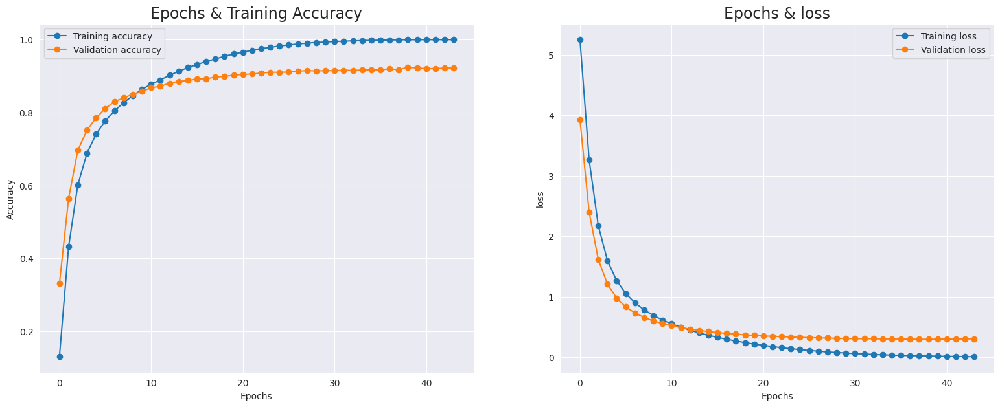

In [ ]:
#Visualizing the result
acc = model_hist_rs3.history['accuracy']
val_acc = model_hist_rs3.history['val_accuracy']
loss = model_hist_rs3.history['loss']
val_loss = model_hist_rs3.history['val_loss']

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (19,7))
sns.set_style("darkgrid")

ax[0].plot(acc, 'o-',label = 'Training accuracy')
ax[0].plot(val_acc, 'o-',label = 'Validation accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].set_title('Epochs & Training Accuracy', fontsize = 17)
ax[0].legend(loc='best')


ax[1].plot(loss, 'o-',label = 'Training loss')
ax[1].plot(val_loss, 'o-',label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('loss')
ax[1].set_title('Epochs & loss', fontsize = 17)
ax[1].legend(loc='best')
sns.set_style("darkgrid")

In [ ]:
test_labels = test_data.class_names

plt.figure(figsize=(30, 30))

for image, label in test_data.take(1):
    model_prediction = model_res3.predict(image)
    for i in range(30):
        plt.subplot(6, 5, i+1)
        plt.imshow(image[i].numpy().astype("int"))
        p = test_labels[tf.argmax(tf.round(model_prediction[i]))]
        t = test_labels[(label[i])]
        if p == t:
          m = "Perfect"
        else:
          m = "Error"
        plt.title(f"Prediction: {p}\n Original Labels : {t}\n Match : {m}")
        plt.grid(False)
        plt.axis("off")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

# EficientNet_v2_B2 - bez skalowania - dobre wyniki

In [ ]:
# Downloading the pre-trained model from API
eff_netB2_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B2(
                    include_top=False,
                    weights='imagenet',
                    input_shape=(224,224,3),
                    pooling='max',
                    classes=525,
                    classifier_activation='softmax'
                )

# setting all the layers of this model to false
for layer in eff_netB2_model.layers:
    layer.trainable = False

In [ ]:
model_eB2= Sequential()
model_eB2.add(eff_netB2_model)
model_eB2.add(Dense(1024,activation='relu'))
model_eB2.add(BatchNormalization())
model_eB2.add(Dense(512,activation='relu'))
model_eB2.add(Dense(525,activation='softmax'))

model_eB2.summary()

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetv2-b2 (Function  (None, 1408)             8769374   
 al)                                                             
                                                                 
 dense_40 (Dense)            (None, 1024)              1442816   
                                                                 
 batch_normalization_12 (Bat  (None, 1024)             4096      
 chNormalization)                                                
                                                                 
 dense_41 (Dense)            (None, 512)               524800    
                                                                 
 dense_42 (Dense)            (None, 525)               269325    
                                                                 
Total params: 11,010,411
Trainable params: 2,238,989


In [ ]:
model_eB2.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.00001), loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
# callback early stopping
# zatrzymanie treningu w momencie, kiedy val_loss nie spada przez n epok
es_eb2 = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",
    min_delta=0.001,
    patience=5
)

# dodajemy zapisywanie logów do tensorboard'a
log_dir = "drive/Othercomputers/MacBook/Projekt_DL/dane/logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
model_hist_eB2 = model_eB2.fit(train_data, validation_data = val_data, epochs = 45, callbacks = [tensorboard_callback, es_eb2])

Epoch 1/45
2645/2645 [==============================] - 208s 75ms/step - loss: 5.3736 - accuracy: 0.1138 - val_loss: 3.9302 - val_accuracy: 0.3406
Epoch 2/45
2645/2645 [==============================] - 199s 75ms/step - loss: 3.3882 - accuracy: 0.4135 - val_loss: 2.2112 - val_accuracy: 0.6141
Epoch 3/45
2645/2645 [==============================] - 199s 75ms/step - loss: 2.1573 - accuracy: 0.6177 - val_loss: 1.3293 - val_accuracy: 0.7684
Epoch 4/45
2645/2645 [==============================] - 198s 75ms/step - loss: 1.4985 - accuracy: 0.7219 - val_loss: 0.8960 - val_accuracy: 0.8377
Epoch 5/45
2645/2645 [==============================] - 202s 76ms/step - loss: 1.1343 - accuracy: 0.7776 - val_loss: 0.6672 - val_accuracy: 0.8716
Epoch 6/45
2645/2645 [==============================] - 198s 75ms/step - loss: 0.9143 - accuracy: 0.8127 - val_loss: 0.5313 - val_accuracy: 0.8937
Epoch 7/45
2645/2645 [==============================] - 198s 75ms/step - loss: 0.7684 - accuracy: 0.8366 - val_loss: 0

In [ ]:
model_eB2.save('drive/Othercomputers/MacBook/Projekt_DL/dane/model_efnetB2_poprawny.h5')

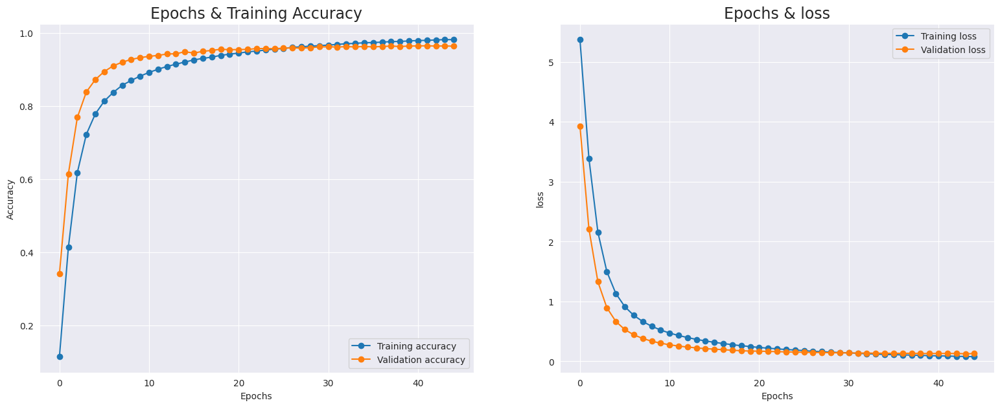

In [ ]:
#Visualizing the result
acc = model_hist_eB2.history['accuracy']
val_acc = model_hist_eB2.history['val_accuracy']
loss = model_hist_eB2.history['loss']
val_loss = model_hist_eB2.history['val_loss']

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (19,7))
sns.set_style("darkgrid")

ax[0].plot(acc, 'o-',label = 'Training accuracy')
ax[0].plot(val_acc, 'o-',label = 'Validation accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].set_title('Epochs & Training Accuracy', fontsize = 17)
ax[0].legend(loc='best')


ax[1].plot(loss, 'o-',label = 'Training loss')
ax[1].plot(val_loss, 'o-',label = 'Validation loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('loss')
ax[1].set_title('Epochs & loss', fontsize = 17)
ax[1].legend(loc='best')
sns.set_style("darkgrid")

In [ ]:
test_labels = test_data.class_names

plt.figure(figsize=(30, 30))

for image, label in test_data.take(1):
    model_prediction = model_eB2.predict(image)
    for i in range(30):
        plt.subplot(6, 5, i+1)
        plt.imshow(image[i].numpy().astype("int"))
        p = test_labels[tf.argmax(tf.round(model_prediction[i]))]
        t = test_labels[(label[i])]
        if p == t:
          m = "Perfect"
        else:
          m = "Error"
        plt.title(f"Prediction: {p}\n Original Labels : {t}\n Match : {m}")
        plt.grid(False)
        plt.axis("off")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

# uruchomienie tesnorboard w colab

In [ ]:
%load_ext tensorboard

In [ ]:
log_folder = 'drive/Othercomputers/MacBook/Projekt_DL/dane/logs'

In [ ]:
tensorboard --logdir={log_folder}

Output hidden; open in https://colab.research.google.com to view.

Uruchomienie serwera, jeżeli z poziomu notebooka nie działa, to należy uruchomić z cmd\
```tensorboard --logdir "logs"```

# Próba wstawienia raportow i macierzy dla najlepszych modeli

In [ ]:
### Models to import and place information in prezentation

# 1) model_cnn - my creation- ('drive/Othercomputers/MacBook/Projekt_DL/dane/model_cnn_newest.h5')
# 2) model_res3 - ResNet50_v2- ('drive/Othercomputers/MacBook/Projekt_DL/dane/model_res50_resc.h5')
# 3) model_eB2 - EfficentNet_v2_B2('drive/Othercomputers/MacBook/Projekt_DL/dane/model_efnetB2_poprawny.h5')
# 4) model - EfficientNet_B0 - ('drive/Othercomputers/MacBook/Projekt_DL/dane/model_EfB0_newest.h5')


## Prosty CNN

In [ ]:
# wczytanie
model_l_cnn = tf.keras.models.load_model("drive/Othercomputers/MacBook/Projekt_DL/dane/model_cnn_newest.h5")

In [ ]:
model_l_cnn.evaluate(val_data)

83/83 [==============================] - 3s 34ms/step - loss: 2.5282 - accuracy: 0.4442


[2.5281589031219482, 0.44419047236442566]

In [ ]:
model_l_cnn.evaluate(test_data)

83/83 [==============================] - 235s 3s/step - loss: 2.4299 - accuracy: 0.4556


[2.4299402236938477, 0.45561903715133667]

1/1 [==============================] - 0s 31ms/step


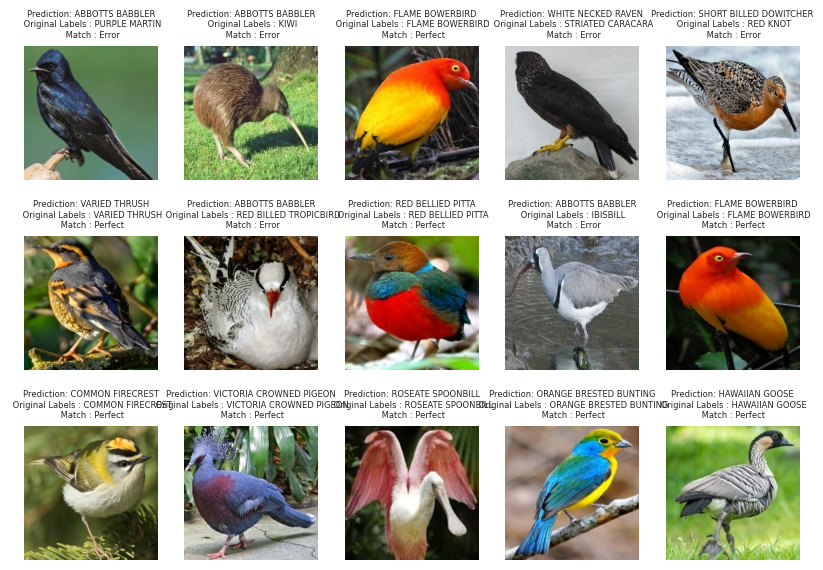

In [ ]:
test_labels = test_data.class_names

plt.figure(figsize=(10, 7))

for image, label in test_data.take(1):
    model_prediction = model_l_cnn.predict(image)
    for i in range(15):
        plt.subplot(3, 5, i+1)
        plt.imshow(image[i].numpy().astype("int"))
        p = test_labels[tf.argmax(tf.round(model_prediction[i]))]
        t = test_labels[(label[i])]
        if p == t:
          m = "Perfect"
        else:
          m = "Error"
        plt.title(f"Prediction: {p}\n Original Labels : {t}\n Match : {m}", fontsize=6)
        plt.grid(False)
        plt.axis("off")
    plt.show()

In [ ]:
y_pred = []  # store predicted labels
y_true = []  # store true labels

# iterate over the dataset
for image_batch, label_batch in test_data:   # use dataset.unbatch() with repeat
   # append true labels
   y_true.append(label_batch)
   # compute predictions
   preds = model_l_cnn.predict(image_batch)
   # append predicted labels
   y_pred.append(np.argmax(preds, axis = - 1))

# convert the true and predicted labels into tensors
correct_labels = tf.concat([item for item in y_true], axis = 0)
predicted_labels = tf.concat([item for item in y_pred], axis = 0)


In [ ]:
report_c = classification_report(correct_labels, predicted_labels, output_dict=True)
df_c = pd.DataFrame(report_c).transpose()
df_c.to_csv('drive/Othercomputers/MacBook/Projekt_DL/dane/class_report_SimpleCnn.csv')

#print(classification_report(correct_labels, predicted_labels))


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
# creating confusion matrix and exporting it to csv
#pd.DataFrame(confusion_matrix(correct_labels, predicted_labels)).to_csv('drive/Othercomputers/MacBook/Projekt_DL/dane/conf_matrix_cnn.csv')


## ResNet

In [ ]:
model_l_res = tf.keras.models.load_model('drive/Othercomputers/MacBook/Projekt_DL/dane/model_res50_resc.h5')

In [ ]:
model_l_res.evaluate(val_data)

83/83 [==============================] - 10s 94ms/step - loss: 0.3059 - accuracy: 0.9223


[0.3059050738811493, 0.9222857356071472]

In [ ]:
model_l_res.evaluate(test_data)

83/83 [==============================] - 8s 91ms/step - loss: 0.2088 - accuracy: 0.9337


[0.2088291496038437, 0.9337142705917358]

In [ ]:
y_pred_r = []  # store predicted labels
y_true_r = []  # store true labels

# iterate over the dataset
for image_batch, label_batch in test_data:   # use dataset.unbatch() with repeat
   # append true labels
   y_true_r.append(label_batch)
   # compute predictions
   preds_r = model_l_res.predict(image_batch)
   # append predicted labels
   y_pred_r.append(np.argmax(preds_r, axis = - 1))

# convert the true and predicted labels into tensors
correct_labels_r = tf.concat([item for item in y_true_r], axis = 0)
predicted_labels_r = tf.concat([item for item in y_pred_r], axis = 0)

In [ ]:
report_r = classification_report(correct_labels_r, predicted_labels_r, output_dict=True)
df_r = pd.DataFrame(report_r).transpose()
df_r.to_csv('drive/Othercomputers/MacBook/Projekt_DL/dane/class_report_ResNet50.csv')

#print(classification_report(correct_labels_r, predicted_labels_r))

In [ ]:
# creating confusion matrix and exporting it to csv
#pd.DataFrame(confusion_matrix(correct_labels_r, predicted_labels_r)).to_csv('drive/Othercomputers/MacBook/Projekt_DL/dane/conf_matrix_ResNet.csv')

## Efficient_Net_B0

In [ ]:
model_l_e0 = tf.keras.models.load_model('drive/Othercomputers/MacBook/Projekt_DL/dane/model_EfB0_newest.h5')

In [ ]:
model_l_e0.evaluate(val_data)

83/83 [==============================] - 7s 61ms/step - loss: 0.0991 - accuracy: 0.9771


[0.09906203299760818, 0.977142870426178]

In [ ]:
model_l_e0.evaluate(test_data)

83/83 [==============================] - 5s 61ms/step - loss: 0.0544 - accuracy: 0.9844


[0.05438653752207756, 0.9843809604644775]

In [ ]:
y_pred_e0 = []  # store predicted labels
y_true_e0 = []  # store true labels

# iterate over the dataset
for image_batch, label_batch in test_data:   # use dataset.unbatch() with repeat
   # append true labels
   y_true_e0.append(label_batch)
   # compute predictions
   preds_e0 = model_l_e0.predict(image_batch)
   # append predicted labels
   y_pred_e0.append(np.argmax(preds_e0, axis = - 1))

# convert the true and predicted labels into tensors
correct_labels_e0 = tf.concat([item for item in y_true_e0], axis = 0)
predicted_labels_e0 = tf.concat([item for item in y_pred_e0], axis = 0)

In [ ]:
report_e0 = classification_report(correct_labels_e0, predicted_labels_e0, output_dict=True)
df_e0 = pd.DataFrame(report_e0).transpose()
df_e0.to_csv('drive/Othercomputers/MacBook/Projekt_DL/dane/class_report_EfNetB0_newest.csv')

#print(classification_report(correct_labels_e0, predicted_labels_e0))

In [ ]:
# creating confusion matrix and exporting it to csv
#pd.DataFrame(confusion_matrix(correct_labels_e0, predicted_labels_e0)).to_csv('drive/Othercomputers/MacBook/Projekt_DL/dane/conf_matrix_EfNetB0_new.csv')

## EficentNet_B2_v2

In [ ]:
model_l_e2 = tf.keras.models.load_model('drive/Othercomputers/MacBook/Projekt_DL/dane/model_efnetB2_poprawny.h5')

In [ ]:
model_l_e2.evaluate(val_data)

83/83 [==============================] - 9s 71ms/step - loss: 0.1295 - accuracy: 0.9630


[0.12952008843421936, 0.9630476236343384]

In [ ]:
model_l_e2.evaluate(test_data)

83/83 [==============================] - 6s 68ms/step - loss: 0.0664 - accuracy: 0.9821


[0.06636076420545578, 0.9820952415466309]

In [ ]:
y_pred_e2 = []  # store predicted labels
y_true_e2 = []  # store true labels

# iterate over the dataset
for image_batch, label_batch in test_data:   # use dataset.unbatch() with repeat
   # append true labels
   y_true_e2.append(label_batch)
   # compute predictions
   preds_e2 = model_l_e2.predict(image_batch)
   # append predicted labels
   y_pred_e2.append(np.argmax(preds_e2, axis = - 1))

# convert the true and predicted labels into tensors
correct_labels_e2 = tf.concat([item for item in y_true_e2], axis = 0)
predicted_labels_e2 = tf.concat([item for item in y_pred_e2], axis = 0)

In [ ]:
report_e2 = classification_report(correct_labels_e2, predicted_labels_e2, output_dict=True)
df_e2 = pd.DataFrame(report_e2).transpose()
df_e2.to_csv('drive/Othercomputers/MacBook/Projekt_DL/dane/class_report_EfNetB2v2.csv')

#print(classification_report(correct_labels_e2, predicted_labels_e2))

In [ ]:
# creating confusion matrix and exporting it to csv
#pd.DataFrame(confusion_matrix(correct_labels_e2, predicted_labels_e2)).to_csv('drive/Othercomputers/MacBook/Projekt_DL/dane/conf_matrix_EfNetB2v2.csv')